# ВЫПУСКНАЯ КВАЛИФИКАЦИОННАЯ РАБОТА

слушателя курса "Data Science" 

Образовательного центра 

Московского государственного технического университета им. Н.Э. Баумана

Старостиной Ярославы Константиновны

Тема: Прогнозирование конечных свойств новых материалов (композиционных материалов). 

Цель исследования: построение моделей прогнозирования следующих параметров: «модуль упругости при растяжении»; «прочность при растяжении»; «соотношение матрица-наполнитель»

Итог работы: Разработка приложения с графическим интерфейсом, которое будет выдавать прогноз параметра «соотношение матрица-наполнитель».

Импорт необходимых библиотек для исследования

In [4]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import tensorflow as tf

from numpy.random import seed
from pandas import read_excel, DataFrame, Series
from scipy import stats

from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import preprocessing

from tensorflow import keras as keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.models import Sequential

import warnings
warnings.filterwarnings("ignore")

2. Загрузка данных

In [5]:
#Загружаем первый датасет (базальтопластик) и посмотрим на названия столбцов
df_bp = pd.read_excel(r"C:\Users\Ярослава\Untitled Folder\Датасет для ВКР_композиты\X_bp.xlsx")
df_bp.shape

(1023, 11)

In [6]:
#Удаляем первый неинформативный столбец
df_bp.drop(['Unnamed: 0'], axis=1, inplace=True)
#Посмотрим на первые 5 строк первого датасета и убедимся, что первый столбец удалился
df_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [7]:
# Проверим размерность первого файла
df_bp.shape

(1023, 10)

In [8]:
# Загружаем второй датасет (углепластик) 
df_nup = pd.read_excel(r"C:\Users\Ярослава\Untitled Folder\Датасет для ВКР_композиты\X_nup.xlsx")
df_nup.shape

(1040, 4)

In [9]:
#Удаляем первый неинформативный столбец
df_nup.drop(['Unnamed: 0'], axis=1, inplace=True)
#Посмотрим на первые 5 строк второго датасета и убедимся, что и здесь не нужный первый столбец успешно удалился
df_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [10]:
# Проверим размерность второго файла
df_nup.shape

(1040, 3)

Объединение по индексу, тип объединения INNER, смотрим итоговый датасет

In [11]:
# Данные два датасета имеют разный объем строк, по условию задачи объединение по типу INNER. 
df = df_bp.merge(df_nup, left_index = True, right_index = True, how = 'inner')
df.head().T

,0,1,2,3,4
Соотношение матрица-наполнитель,1.857143,1.857143,1.857143,1.857143,2.771331
"Плотность, кг/м3",2030.000000,2030.000000,2030.000000,2030.000000,2030.000000
"модуль упругости, ГПа",738.736842,738.736842,738.736842,738.736842,753.000000
"Количество отвердителя, м.%",30.000000,50.000000,49.900000,129.000000,111.860000
"Содержание эпоксидных групп,%_2",22.267857,23.750000,33.000000,21.250000,22.267857
"Температура вспышки, С_2",100.000000,284.615385,284.615385,300.000000,284.615385
"Поверхностная плотность, г/м2",210.000000,210.000000,210.000000,210.000000,210.000000
"Модуль упругости при растяжении, ГПа",70.000000,70.000000,70.000000,70.000000,70.000000
"Прочность при растяжении, МПа",3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
"Потребление смолы, г/м2",220.000000,220.000000,220.000000,220.000000,220.000000


In [12]:
#Посмотрим количество колонок и столбцов
df.shape

(1023, 13)

In [29]:
# Сохранение итогового датасета
df.to_excel("Датасет для ВКР_композиты\merge.xlsx")

Итоговый датасет имеет 13 столбцов и 1023 строки, 17 строк из таблицы X_nup было отброшено,т.е часть данных удалена на начальном этапе исследования.

Ознакомление с данными

In [14]:
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

все переменные содержат значения float64, качественные характеристики отсутствуют. Пропусков не имеется. Ни одна из записей не является NaN, очистка не требуется. Объединенный файл имеет всего 1023 строки.

In [16]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Принимая во внимание тот факт, что величина "Угол нашивки" является величиной экспериментальноисследуемой, поэтому данный столбец не следует подтвергать кодировке, так как "продакшене" можно будет столкнуться и с другими значениями градусов.

Описательная статистика данных

In [17]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


Описательная статистика содержит по каждому столбцу (по каждой переменной):
count - количество значений
mean - среднее значение
std - стандартное отклонение
min - минимум
25% - верхнее значение первого квартиля
50% - медиана
75% - верхнее значение третьего квартиля
max - максимум

In [18]:
# Проверка на дубликаты
df.duplicated().sum()

0

В статистике коэффициент ранговой корреляции Кендалла, обычно называемый коэффициентом Кендалла τ (после греческой буквы τ), представляет собой статистический показатель, используемый для измерения порядковой связи между двумя измеряемыми величинами. Это мера ранговой корреляции: сходство упорядочения данных при ранжировании по каждой из величин. 
Интуитивно понятно, что корреляция Кендалла между двумя переменными будет высокой, когда наблюдения имеют одинаковый (или идентичный для корреляции 1) ранг (т.е. метку относительного положения наблюдений внутри переменной: 1-й, 2-й, 3-й и т.д.) Между двумя переменными, и низкой, когда наблюдения имеют разный (или полностью отличается для корреляции -1) ранга между двумя переменными.

In [19]:
# Вычисляем коэффициенты ранговой корреляции Кендалла. Статистической зависимости не наблюдаем.
df.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


В статистике коэффициент корреляции Пирсона, коэффициент корреляции произведение-момент (PPMCC), двумерная корреляция между двумя наборами данных. Это отношение между ковариацией двух переменных и произведением их стандартных отклонений; таким образом, это, по сути, нормализованное измерение ковариации, так что результат всегда имеет значение от -1 до 1. Как и в случае с самой ковариацией, мера может отражать только линейную корреляцию переменных и игнорирует многие другие типы взаимосвязей или корреляций. Форма определения включает в себя "момент произведения", то есть среднее значение (первый момент относительно начала координат) произведения случайных величин с поправкой на среднее значение; отсюда и модификатор product-moment в названии.

In [20]:
#Вычисляем коэффициенты корреляции Пирсона. Статистической зависимости не наблюдаем.
df.corr(method ='pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


Коэффициент корреляции Спирмена (Spearman rank correlation coefficient) — мера линейной связи между случайными величинами. Корреляция Спирмена является ранговой, то есть для оценки силы связи используются не численные значения, а соответствующие им ранги. Коэффициент инвариантен по отношению к любому монотонному преобразованию шкалы измерения.
Коэффициент корреляции Кенделла и коэффициент корреляции Спирмена  выражаются через ранги, но в случае коэффициент корреляции Спирмена инверсиям придаются дополнительные веса (j-i), таким образом коэффициент корреляции Спирмена сильнее реагирует на несогласие ранжировок, чем Коэффициент корреляции Кенделла.

In [21]:
#Вычисляем коэффициенты корреляции Пирсона. Статистической зависимости не наблюдаем.
df.corr(method ='spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236


Визуализация данных

Показатели описательной статистики и визуализация гистограмм и/или диаграмм размаха («ящик с усами») позволяют получить наглядное представление о характерах распределений переменных. Такое частотное распределение показывает, какие именно конкретные значения или диапазоны значений исследуемой переменной встречаются наиболее часто, насколько различаются эти значения, расположено ли большинство наблюдений около среднего значения, является распределение симметричным или асимметричным, многомодальным (т.е. имеет две или более вершины) или одномодальным и т.д. По форме распределения можно судить о природе исследуемой переменной

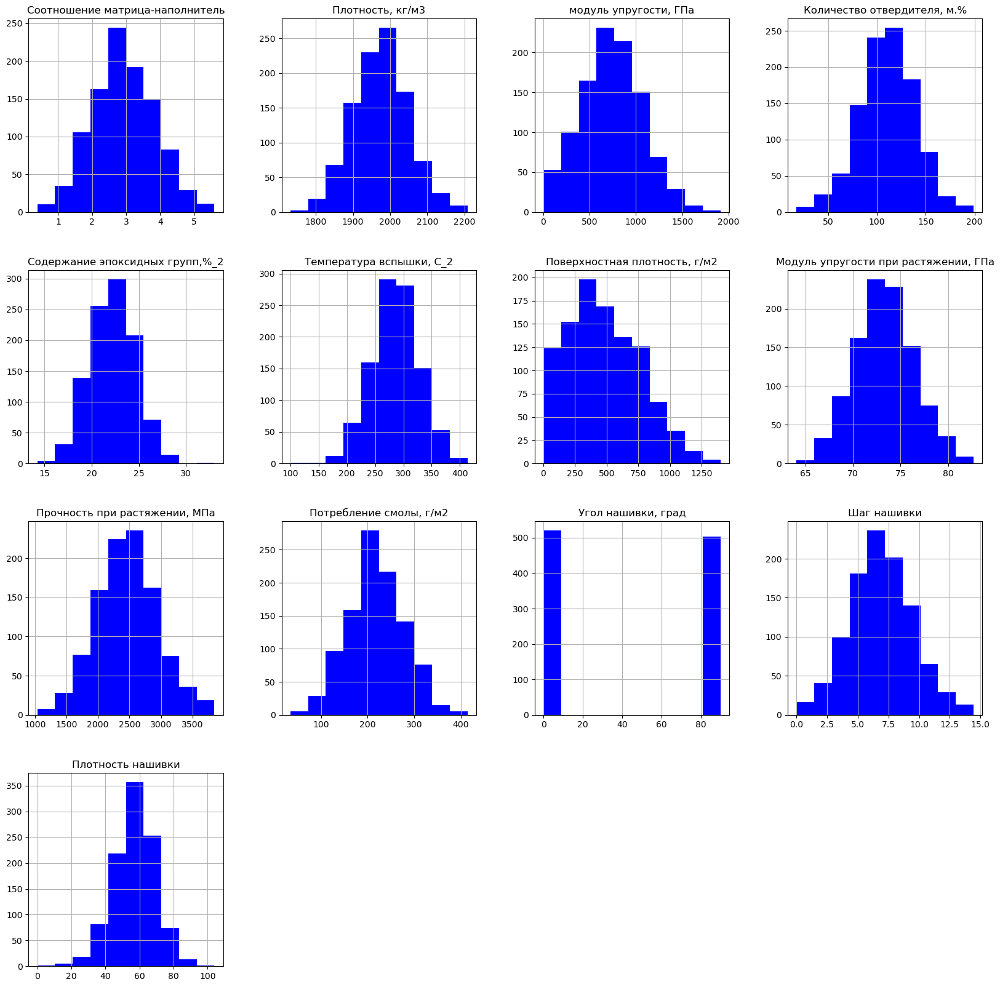

In [22]:
# Построим гистограммы распределения каждой из переменных без нормализации и исключения шумов
df.hist(figsize = (20,20), color = "b")
plt.show()

При проведении анализа выявлены параметры близкие к нормальному: Соотношение матрица-наполнитель; Плотность, кг/м3; Модуль упругости, Гпа; Количество отвердителя, м.%; Содержание эпоксидных групп,%_2; Температура вспышки, С_2; Поверхностная плотность, г/м2; Модуль упругости при растяжении, Гпа; Прочность при растяжении, Мпа; Потребление смолы, г/м2; Шаг нашивки; Плотность нашивки. Преимущественно данные стремятся к нормальному распределению. 

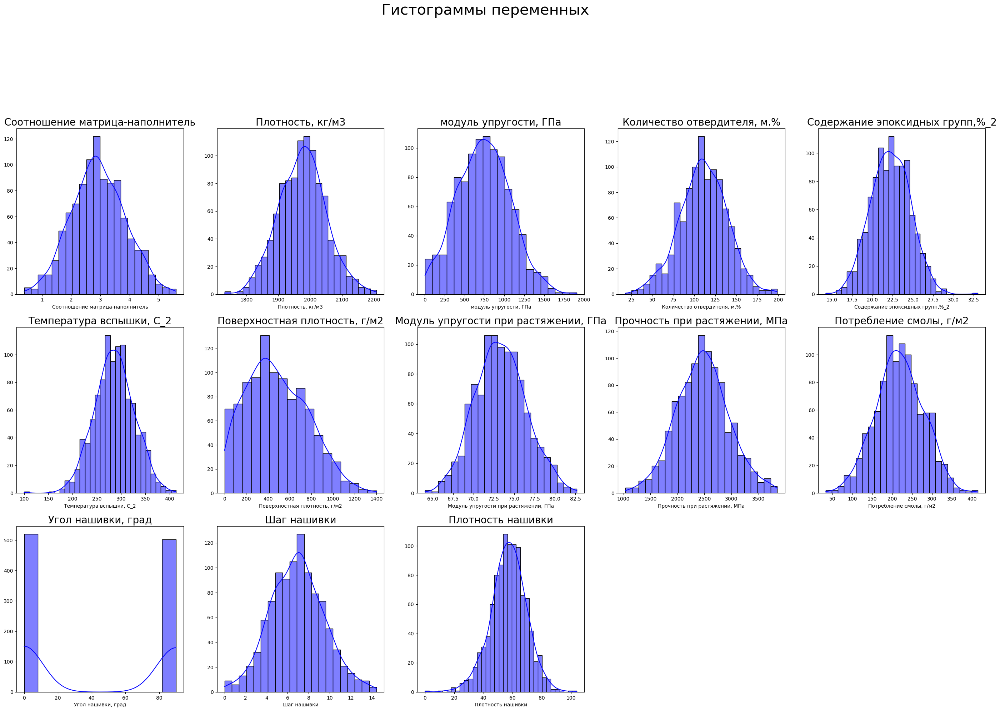

In [23]:
# Гистограмма распределения (второй вариант)
a = 5 # количество строк
b = 5 # количество столцбцов
c = 1 # инициализация plot counter
plt.figure(figsize = (35,35))
plt.suptitle('Гистограммы переменных', fontsize = 30)
for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.histplot(data = df[col], kde=True, color = "blue")
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c += 1
#Гистограммы показывают ярковыраженные выбросы в столбцах: плотность, содержание эпоксидных групп, температура вспышки, плотность нашивки. 

In [24]:
# гистограмма распределения и боксплоты (третий вариант)
for column in df.columns:
    fig = px.histogram(df, x = column, color_discrete_sequence = ['blue'], nbins = 100, marginal = "box")
    fig.show()

In [25]:
for column in df.columns:
    fig = px.box(df, y = column)
    fig.show()

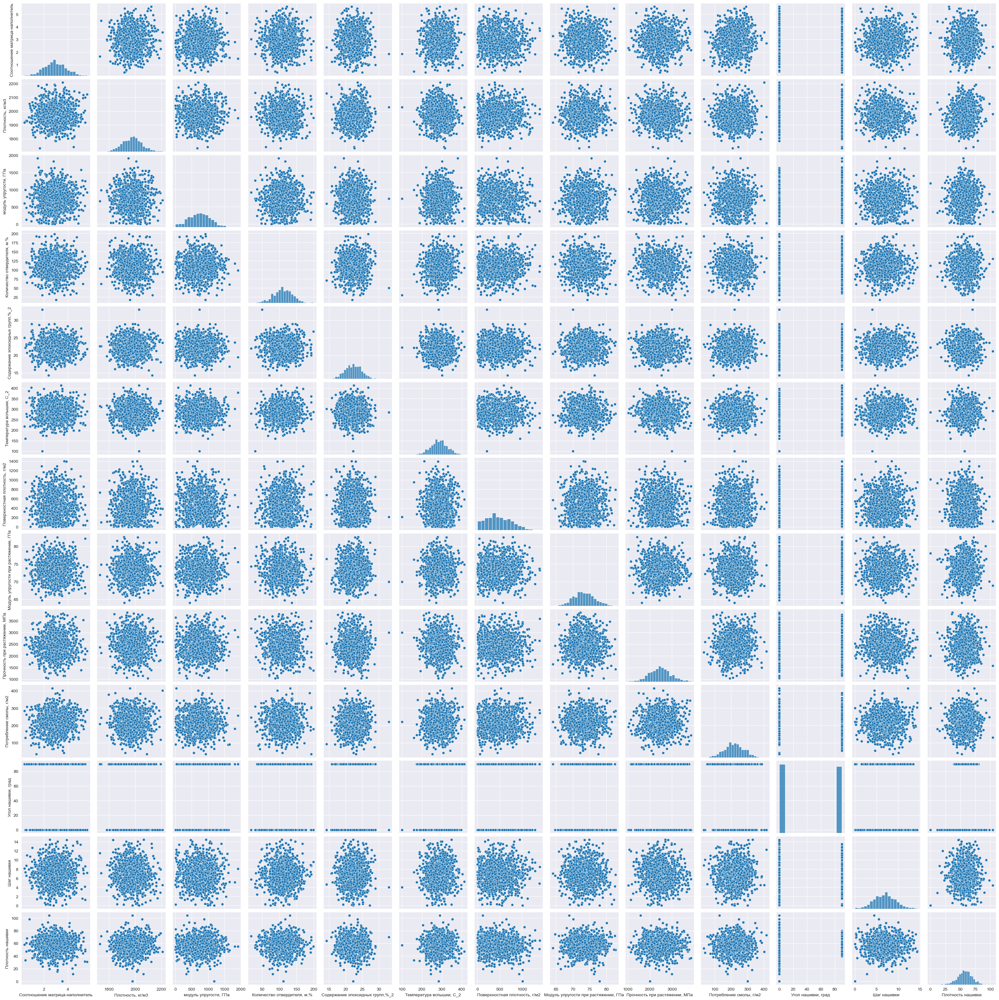

In [26]:
# Попарные графики рассеяния точек (матрица диаграмм рассеяния) (первый вариант)
sns.set_style('darkgrid')
sns.pairplot(df)

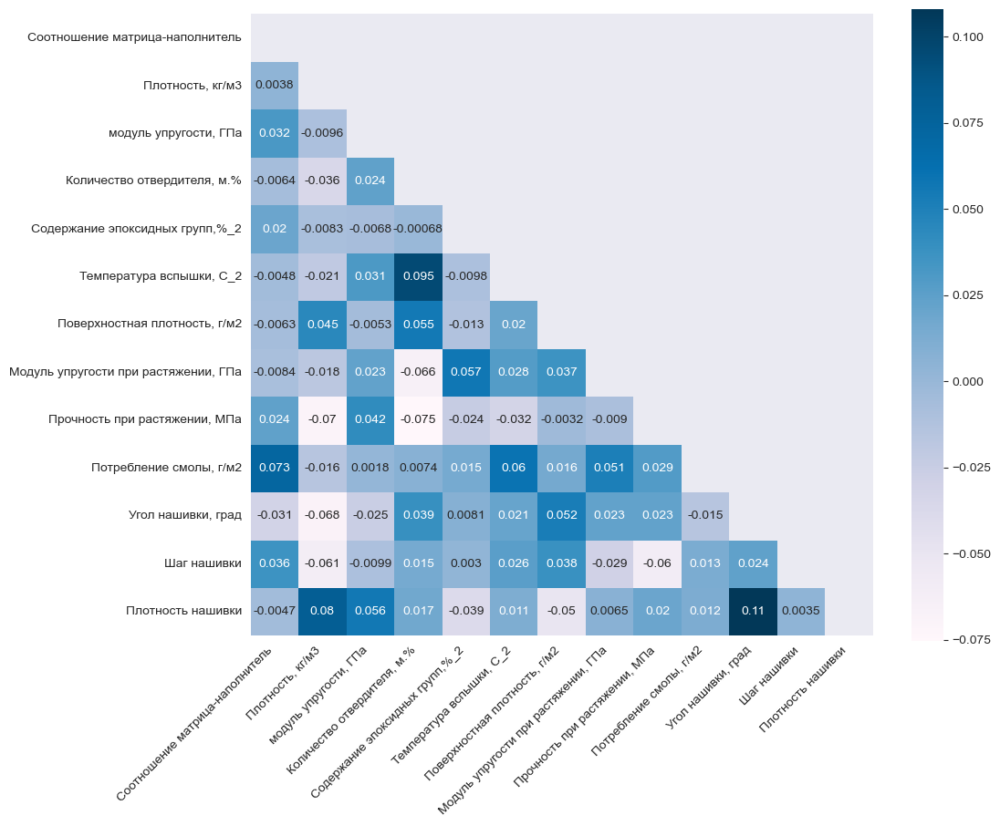

In [27]:
#Визуализация корреляционной матрицы с помощью тепловой карты
mask = np.triu(df.corr())
# Создаем полотно для отображения большого графика
f, ax = plt.subplots(figsize = (11, 9))
# # Визуализируем данные кореляции и создаем цветовую палитру
sns.heatmap(df.corr(), mask = mask, annot = True, square = True, cmap = 'PuBu')
plt.xticks(rotation = 45, ha='right')
plt.show()
# Максимальная корреляция между Плотностью нашивки и углом нашивки и составляет 0.11, что говорит об отсутствии зависимости между этими данными. 
# Корреляция между всеми параметрами очень близка к 0, что говорит об отсутствии корреляционных связей между переменными.

График корреляции подтверждает данные теории композитных материалов. Мы видим, что на качество материла влияет температура вспышки и количество отвердителя из-за взаимодействия отвердителя с матрицей и наполнителем под влиянием температуры. Угол нашивки и плотность нашивки несомненно оказывают влияние на свойства материала. А потребление смолы и соотношение матрицы-наполнителя, плотности и плотности нашивки, модуля упругости и плотности нашивки имеют не особенно выраженную корреляцию.

Вывод на данном этапе работы: наблюдаются выбросы в каждом столбце, корреляция входных переменных очень слабая.

СМ. ПРОДОЛОЖЕНИЕ 2